## HR Analytics: Logistic Regression 

In [1]:
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import pandas_profiling

%matplotlib inline


from sklearn.linear_model import LogisticRegression
from sklearn.cross_validation import train_test_split
from sklearn import metrics 

from matplotlib.backends.backend_pdf import PdfPages

import statsmodels.formula.api as smf
from statsmodels.stats.outliers_influence import variance_inflation_factor
from patsy import dmatrices

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\pandas_profiling\plot.py:15: UserWarning: 
This call to matplotlib.use() has no effect because the backend has already
been chosen; matplotlib.use() must be called *before* pylab, matplotlib.pyplot,
or matplotlib.backends is imported for the first time.

The backend was *originally* set to 'module://ipykernel.pylab.backend_inline' by the following code:
  File "C:\Users\SHIVAM-PC\Anaconda3\lib\runpy.py", line 193, in _run_module_as_main
    "__main__", mod_spec)
  File "C:\Users\SHIVAM-PC\Anaconda3\lib\runpy.py", line 85, in _run_code
    exec(code, run_globals)
  File "C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\ipykernel_launcher.py", line 16, in <module>
    app.launch_new_instance()
  File "C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\traitlets\config\application.py", line 658, in launch_instance
    app.start()
  File "C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\ipykernel\kernelapp.py", line 477, in start
    ioloop.IOLoop.ins

In [2]:
hr_data = pd.read_csv(r'HR_comma_sep.csv')

In [3]:
hr_data

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,left,promotion_last_5years,department,salary
0,0.38,0.53,2,157,3,0,1,0,sales,low
1,0.80,0.86,5,262,6,0,1,0,sales,medium
2,0.11,0.88,7,272,4,0,1,0,sales,medium
3,0.72,0.87,5,223,5,0,1,0,sales,low
4,0.37,0.52,2,159,3,0,1,0,sales,low
5,0.41,0.50,2,153,3,0,1,0,sales,low
6,0.10,0.77,6,247,4,0,1,0,sales,low
7,0.92,0.85,5,259,5,0,1,0,sales,low
8,0.89,1.00,5,224,5,0,1,0,sales,low
9,0.42,0.53,2,142,3,0,1,0,sales,low


In [4]:
hr_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14999 entries, 0 to 14998
Data columns (total 10 columns):
satisfaction_level       14999 non-null float64
last_evaluation          14999 non-null float64
number_project           14999 non-null int64
average_montly_hours     14999 non-null int64
time_spend_company       14999 non-null int64
Work_accident            14999 non-null int64
left                     14999 non-null int64
promotion_last_5years    14999 non-null int64
department               14999 non-null object
salary                   14999 non-null object
dtypes: float64(2), int64(6), object(2)
memory usage: 1.1+ MB


> As we can see there are no missing values.

- Now we'll separate the numerical and categorical data : 

In [5]:
# exploring hr_data via Pandas profiling

pandas_profiling.ProfileReport(hr_data)

Number of variables,10
Number of observations,14999
Total Missing (%),0.0%
Total size in memory,1.1 MiB
Average record size in memory,80.0 B
Numeric,5
Categorical,2
Boolean,3
Date,0
Text (Unique),0
Rejected,0


In [6]:
# handling duplicates 

hr_data.duplicated().sum()

3008

In [7]:
hr_data = hr_data.drop_duplicates()

In [8]:
a = dict(hr_data.dtypes)
a

{'Work_accident': dtype('int64'),
 'average_montly_hours': dtype('int64'),
 'department': dtype('O'),
 'last_evaluation': dtype('float64'),
 'left': dtype('int64'),
 'number_project': dtype('int64'),
 'promotion_last_5years': dtype('int64'),
 'salary': dtype('O'),
 'satisfaction_level': dtype('float64'),
 'time_spend_company': dtype('int64')}

In [9]:
num_var = [key for key in a if a[key] in ['int64' , 'float64' , 'int32' , 'float32']]
cat_var = [key for key in a if a[key] in ['O']]

In [10]:
hr_num = hr_data[num_var]
hr_cat = hr_data[cat_var]

In [11]:
hr_num.head()

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,left,promotion_last_5years
0,0.38,0.53,2,157,3,0,1,0
1,0.80,0.86,5,262,6,0,1,0
2,0.11,0.88,7,272,4,0,1,0
3,0.72,0.87,5,223,5,0,1,0
4,0.37,0.52,2,159,3,0,1,0


In [12]:
hr_cat.head()

,department,salary
0,sales,low
1,sales,medium
2,sales,medium
3,sales,low
4,sales,low


- Data Audit report for numerical HR data :

In [13]:
# creating a method to calculate different metrices for the numerical data : 

def var_summary(x):
    return pd.Series([x.count(), x.isnull().sum(), x.sum(), x.mean(), x.median(),  x.std(), x.var(), x.min(), x.dropna().quantile(0.01), x.dropna().quantile(0.05),x.dropna().quantile(0.10),x.dropna().quantile(0.25),x.dropna().quantile(0.50),x.dropna().quantile(0.75), x.dropna().quantile(0.90),x.dropna().quantile(0.95), x.dropna().quantile(0.99),x.max()], 
                  index=['N', 'NMISS', 'SUM', 'MEAN','MEDIAN', 'STD', 'VAR', 'MIN', 'P1' , 'P5' ,'P10' ,'P25' ,'P50' ,'P75' ,'P90' ,'P95' ,'P99' ,'MAX'])


In [14]:
hr_num.apply(var_summary).T

,N,NMISS,SUM,MEAN,MEDIAN,STD,VAR,MIN,P1,P5,P10,P25,P50,P75,P90,P95,P99,MAX
satisfaction_level,11991.0,0.0,7550.23,0.629658,0.66,0.241070,0.058115,0.09,0.10,0.14,0.24,0.48,0.66,0.82,0.92,0.96,0.99,1.0
last_evaluation,11991.0,0.0,8593.74,0.716683,0.72,0.168343,0.028339,0.36,0.39,0.47,0.50,0.57,0.72,0.86,0.95,0.98,1.00,1.0
number_project,11991.0,0.0,45600.00,3.802852,4.00,1.163238,1.353123,2.00,2.00,2.00,2.00,3.00,4.00,5.00,5.00,6.00,7.00,7.0
average_montly_hours,11991.0,0.0,2403878.00,200.473522,200.00,48.727813,2374.399778,96.00,104.00,130.00,138.00,157.00,200.00,243.00,265.00,273.00,296.00,310.0
time_spend_company,11991.0,0.0,40348.00,3.364857,3.00,1.330240,1.769537,2.00,2.00,2.00,2.00,3.00,3.00,4.00,5.00,6.00,8.00,10.0
Work_accident,11991.0,0.0,1850.00,0.154282,0.00,0.361234,0.130490,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,1.00,1.00,1.0
left,11991.0,0.0,1991.00,0.166041,0.00,0.372133,0.138483,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,1.00,1.00,1.0
promotion_last_5years,11991.0,0.0,203.00,0.016929,0.00,0.129012,0.016644,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,1.0


- #### Outliers Handling :

In [15]:
# handling outliers 
 
def outlier_capping(x):
    x = x.clip_upper(x.quantile(0.99))
    x = x.clip_lower(x.quantile(0.01))
    return(x)

hr_num=hr_num.apply(outlier_capping)

In [16]:
hr_num.apply(var_summary).T

,N,NMISS,SUM,MEAN,MEDIAN,STD,VAR,MIN,P1,P5,P10,P25,P50,P75,P90,P95,P99,MAX
satisfaction_level,11991.0,0.0,7550.33,0.629666,0.66,0.240740,0.057956,0.10,0.10,0.14,0.24,0.48,0.66,0.82,0.92,0.96,0.99,0.99
last_evaluation,11991.0,0.0,8595.65,0.716842,0.72,0.168023,0.028232,0.39,0.39,0.47,0.50,0.57,0.72,0.86,0.95,0.98,1.00,1.00
number_project,11991.0,0.0,45600.00,3.802852,4.00,1.163238,1.353123,2.00,2.00,2.00,2.00,3.00,4.00,5.00,5.00,6.00,7.00,7.00
average_montly_hours,11991.0,0.0,2403413.00,200.434743,200.00,48.485738,2350.866779,104.00,104.00,130.00,138.00,157.00,200.00,243.00,265.00,273.00,296.00,296.00
time_spend_company,11991.0,0.0,40134.00,3.347010,3.00,1.252224,1.568064,2.00,2.00,2.00,2.00,3.00,3.00,4.00,5.00,6.00,8.00,8.00
Work_accident,11991.0,0.0,1850.00,0.154282,0.00,0.361234,0.130490,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,1.00,1.00,1.00
left,11991.0,0.0,1991.00,0.166041,0.00,0.372133,0.138483,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,1.00,1.00,1.00
promotion_last_5years,11991.0,0.0,203.00,0.016929,0.00,0.129012,0.016644,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,1.00


In [17]:
# checking correlations of numerical HR data :

hr_num.corr()

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,left,promotion_last_5years
satisfaction_level,1.000000,0.095458,-0.132655,-0.002791,-0.163907,0.039836,-0.350030,0.019758
last_evaluation,0.095458,1.000000,0.270649,0.264500,0.102009,-0.005630,0.013123,-0.007152
number_project,-0.132655,0.270649,1.000000,0.330007,0.202080,-0.005612,0.030928,-0.000544
average_montly_hours,-0.002791,0.264500,0.330007,1.000000,0.109508,-0.012316,0.066787,-0.004803
time_spend_company,-0.163907,0.102009,0.202080,0.109508,1.000000,-0.003129,0.190451,0.053979
Work_accident,0.039836,-0.005630,-0.005612,-0.012316,-0.003129,1.000000,-0.125436,0.029852
left,-0.350030,0.013123,0.030928,0.066787,0.190451,-0.125436,1.000000,-0.044657
promotion_last_5years,0.019758,-0.007152,-0.000544,-0.004803,0.053979,0.029852,-0.044657,1.000000


- #### Creating boxplots to find out important variables : 

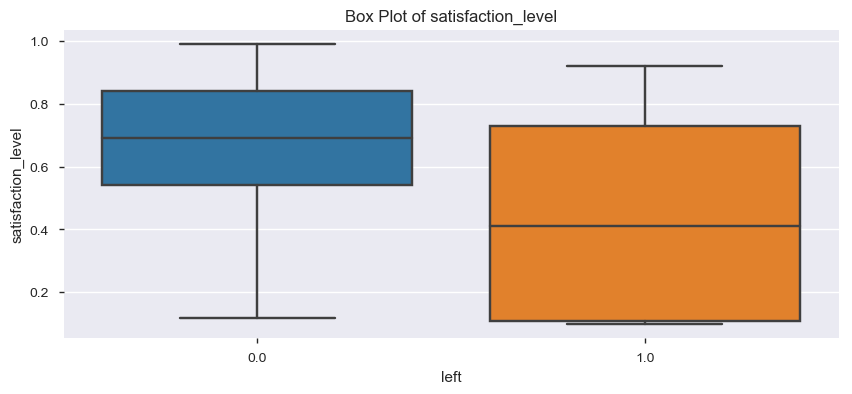

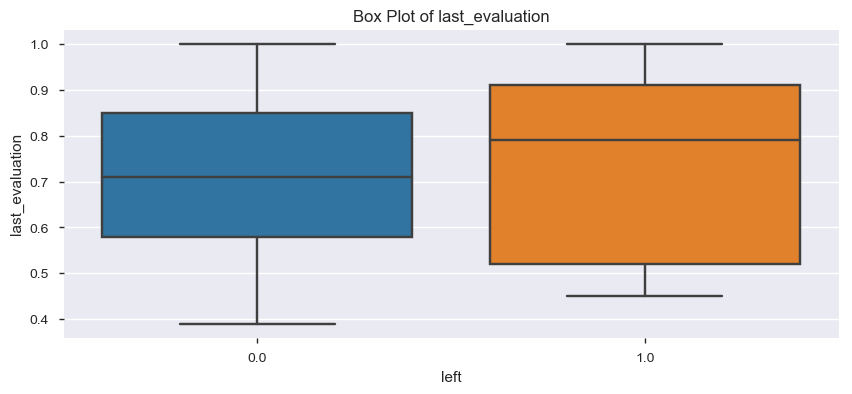

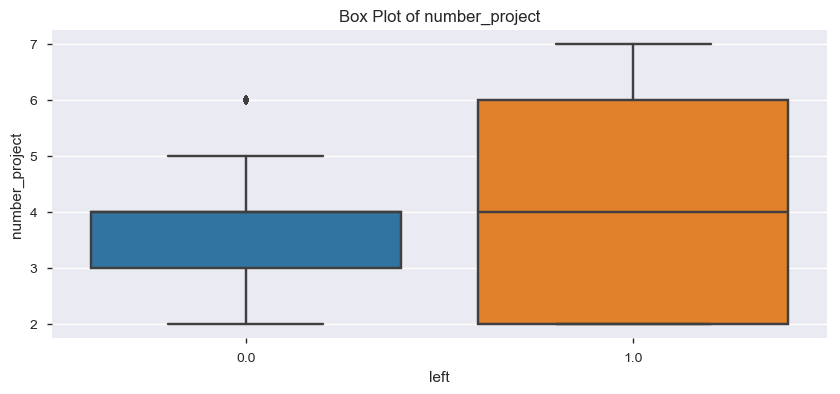

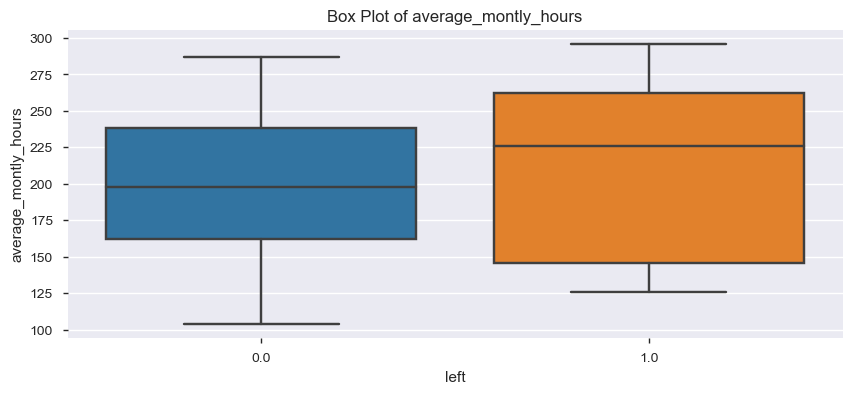

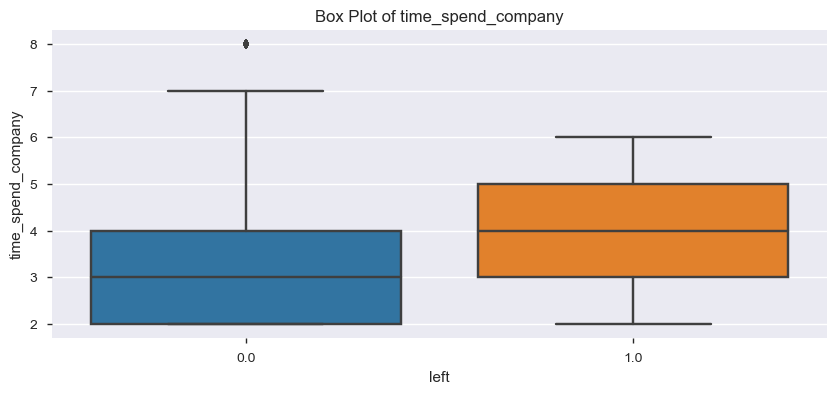

...

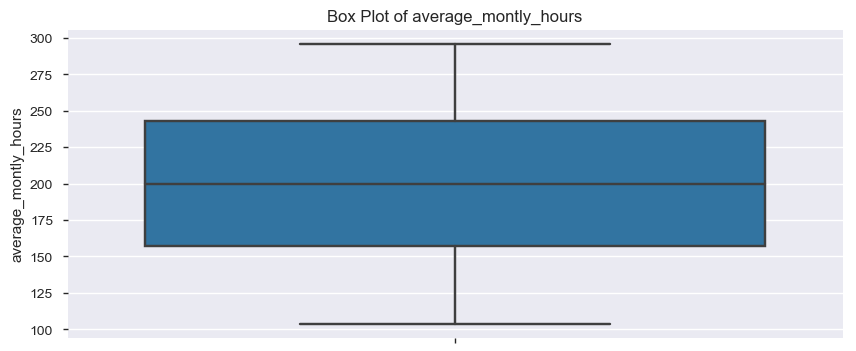

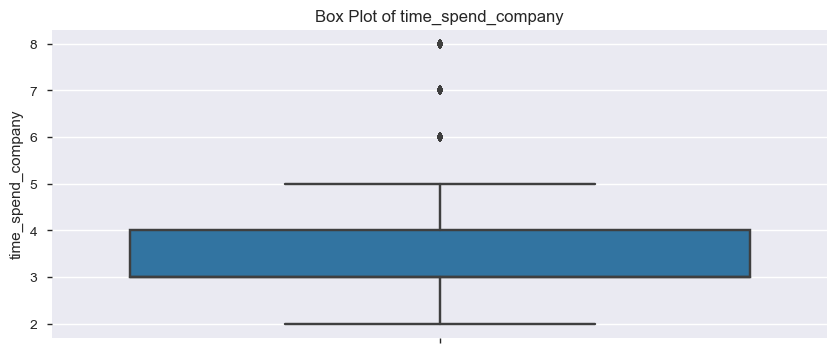

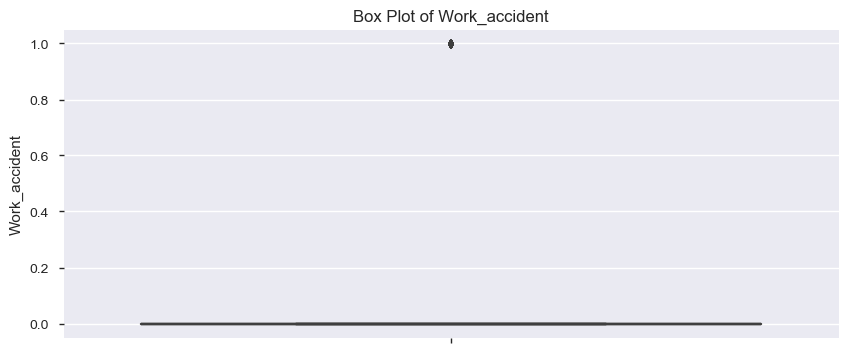

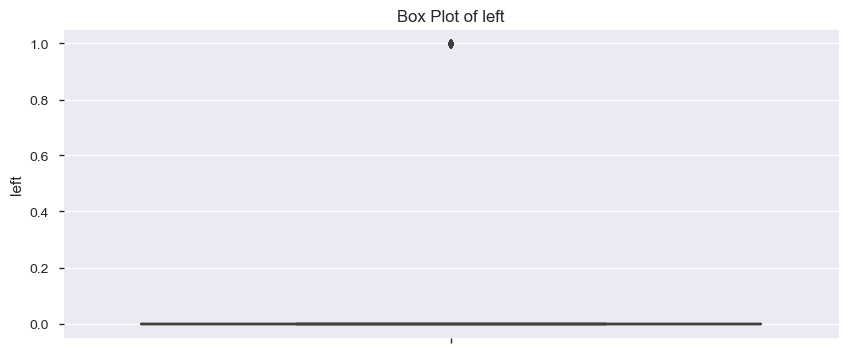

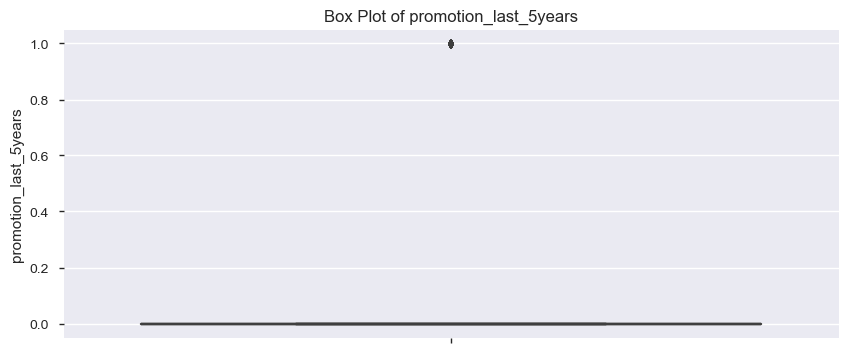

In [18]:
bp = PdfPages('BoxPlots with Left Split.pdf')

for num_variable in num_var:
    fig,axes = plt.subplots(figsize=(10,4))
    sns.boxplot(x='left', y=num_variable, data = hr_num)
    plt.title(str('Box Plot of ') + str(num_variable))
    bp.savefig(fig)
bp.close()

bp = PdfPages('BoxPlots with Total View.pdf')

for num_variable in num_var:
    fig,axes = plt.subplots(figsize=(10,4))
    sns.boxplot(y=num_variable, data = hr_num)
    plt.title(str('Box Plot of ') + str(num_variable))
    bp.savefig(fig)
bp.close()

- Data exploratory Analysis - 
> ####  Bivariate Analysis - Numeric tests(t-tests and ANOVA) , Categorical tests(Chi-Square)

In [19]:
# T-tests for numerical variables : 

tstats_df = pd.DataFrame()
for num_variable in num_var:
    tstats = stats.ttest_ind(hr_data[hr_data['left']==1][num_variable],hr_data[hr_data['left']==0][num_variable])
    temp = pd.DataFrame([num_variable, tstats[0], tstats[1]]).T
    temp.columns = ['Variable Name', 'T-Statistic', 'P-Value']
    tstats_df = pd.concat([tstats_df, temp], axis=0, ignore_index=True)

print(tstats_df)

           Variable Name T-Statistic      P-Value
0     satisfaction_level     -40.985            0
1        last_evaluation     1.48049     0.138769
2         number_project     3.38802  0.000706254
3   average_montly_hours      7.7286  1.17394e-14
4     time_spend_company     19.2663  1.74581e-81
5          Work_accident    -13.8439  2.97778e-43
6                   left         inf            0
7  promotion_last_5years     -4.8946  9.97878e-07


> - As variable ['last evaluation'] did not return p=value less than 0.05, so we can say that this variable doesn't have significant effect on variable ['left'].

- #### Chi square test for Categorical variables : 

In [20]:
# Chi-Square tests for categorical variables : 

cd = pd.crosstab(hr_data['left'] , hr_data['department'])
cd

department,IT,RandD,accounting,hr,management,marketing,product_mng,sales,support,technical
left,,,,,,,,,,
0,818,609,512,488,384,561,576,2689,1509,1854
1,158,85,109,113,52,112,110,550,312,390


In [21]:
cd1 = pd.crosstab(hr_data['left'] , hr_data['salary'])
cd1


salary,high,low,medium
left,,,
0,942,4566,4492
1,48,1174,769


In [22]:
print(stats.chi2_contingency(cd)[0] , stats.chi2_contingency(cd)[1])
print(stats.chi2_contingency(cd1)[0] , stats.chi2_contingency(cd1)[1])

20.8575131538 0.013298329633
175.210719357 8.9841233574e-39


> - As both the p-values is less, so we can say that variables 'department' and 'salary' are important variables to predict variable left.

- #### Data exploratory analysis : Visualization of variable importance : 

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\statsmodels\nonparametric\kde.py:494: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X,a,b,gridsize)/(delta*nobs)
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\statsmodels\nonparametric\kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


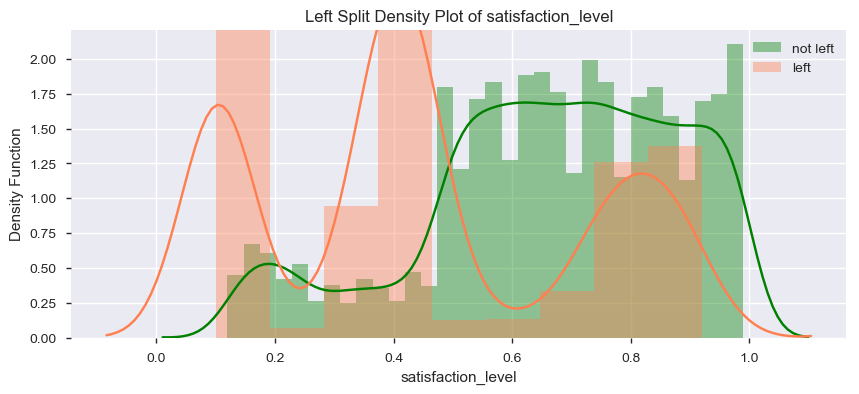

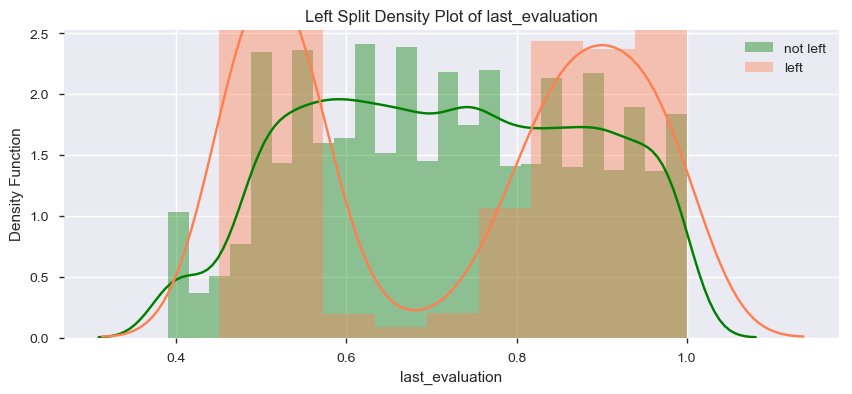

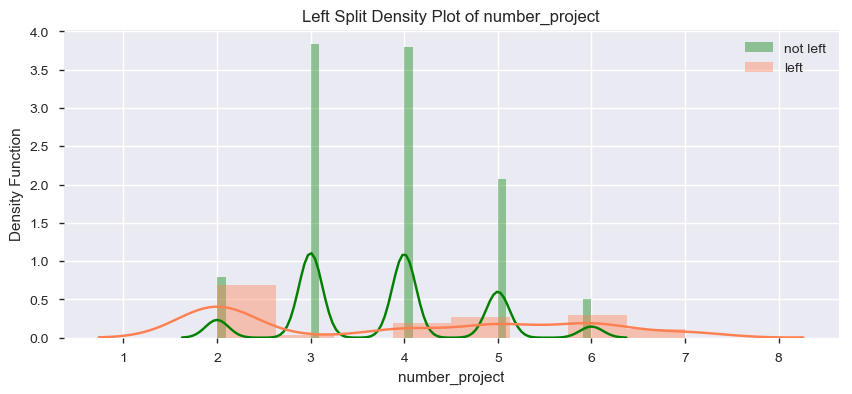

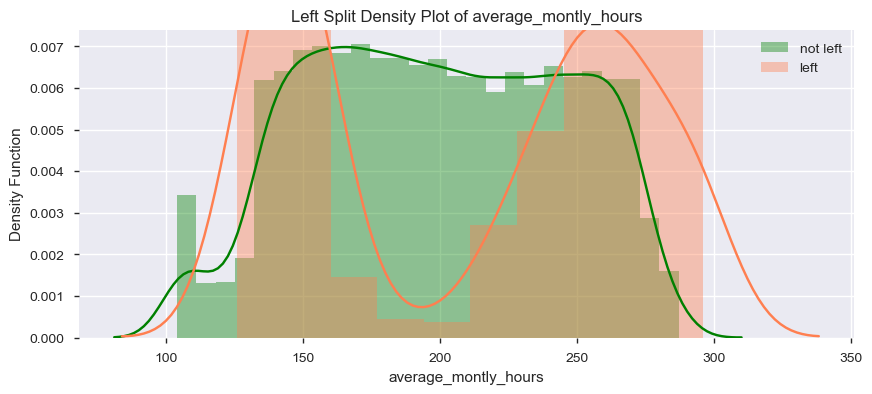

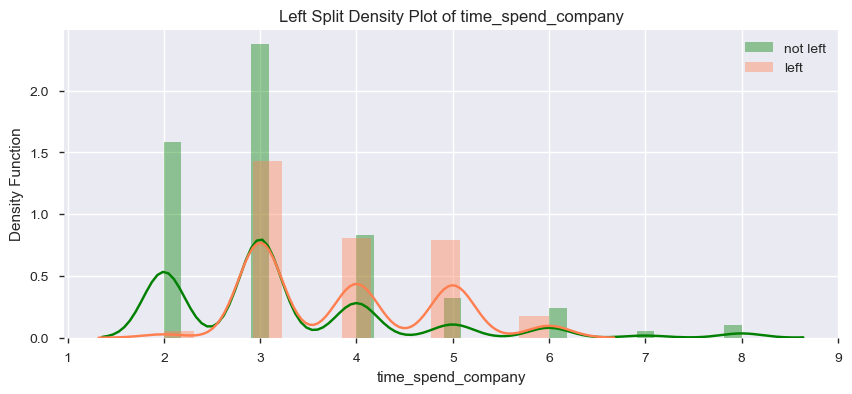

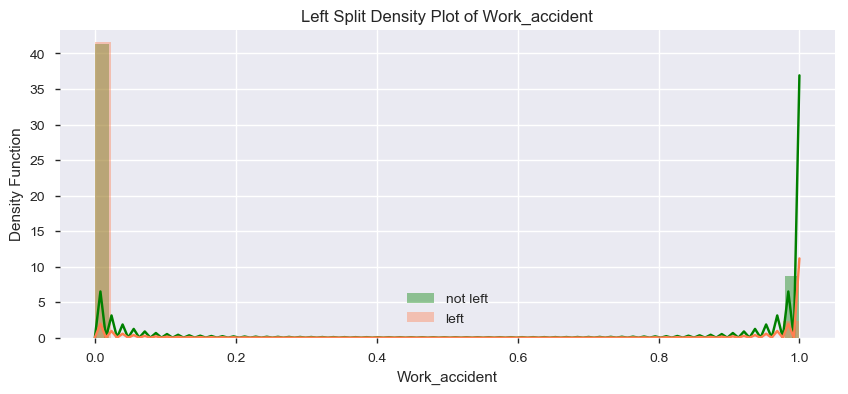

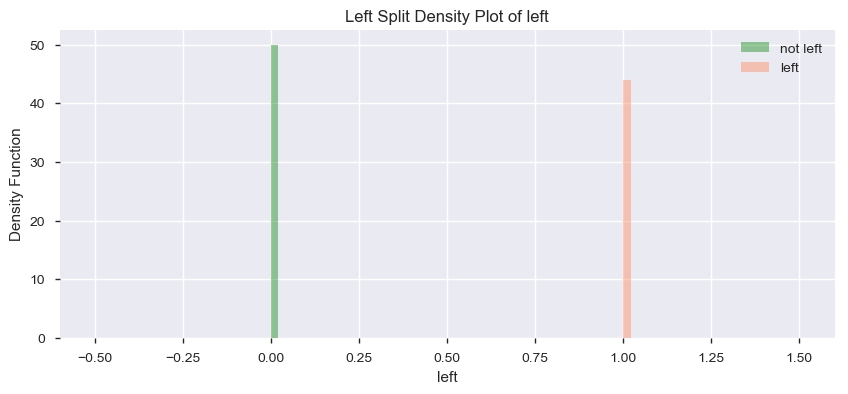

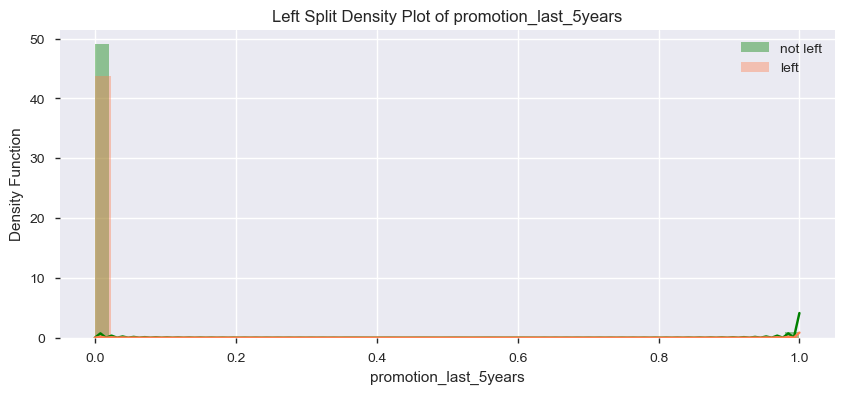

In [23]:
for numerical_variable in num_var : 
    fig,axes = plt.subplots(figsize = (10,4))
    sns.distplot(hr_num[hr_num['left'] == 0][numerical_variable] , label = 'not left' , color = 'g' , hist = True , norm_hist=False)
    sns.distplot(hr_num[hr_num['left'] == 1][numerical_variable] , label = 'left' , color = 'coral' , hist = True , norm_hist = False)
    plt.xlabel(str( numerical_variable))
    plt.ylabel('Density Function')
    plt.title(str('Left Split Density Plot of ') + str(numerical_variable))
    plt.legend()

> Now we know what are the important variables to include in our model for predicting variable left.

- #### Variable Transformation: i.) Bucketing - Converting continous valiables into categorical by bucketing similar groups and then creating their dummy variables  :

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: RuntimeWarning: divide by zero encountered in log
  """


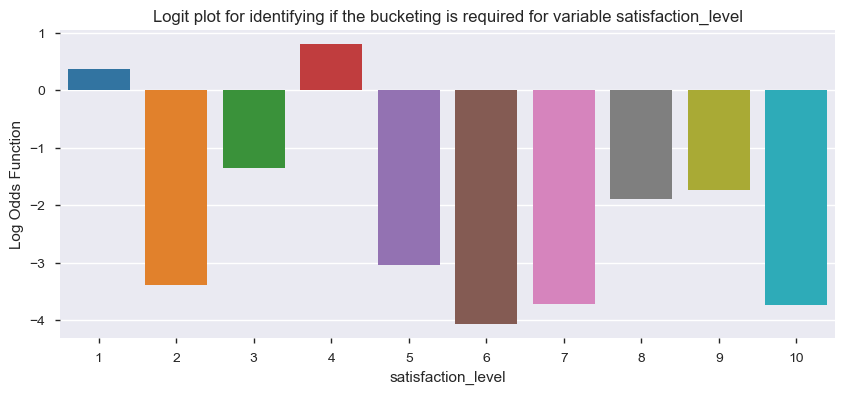

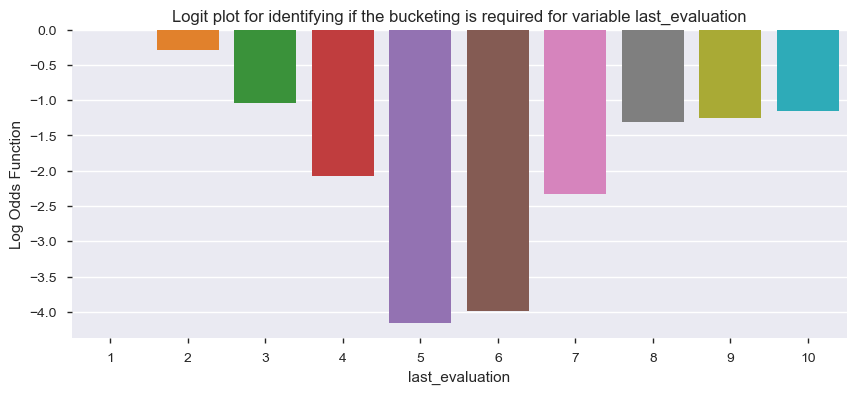

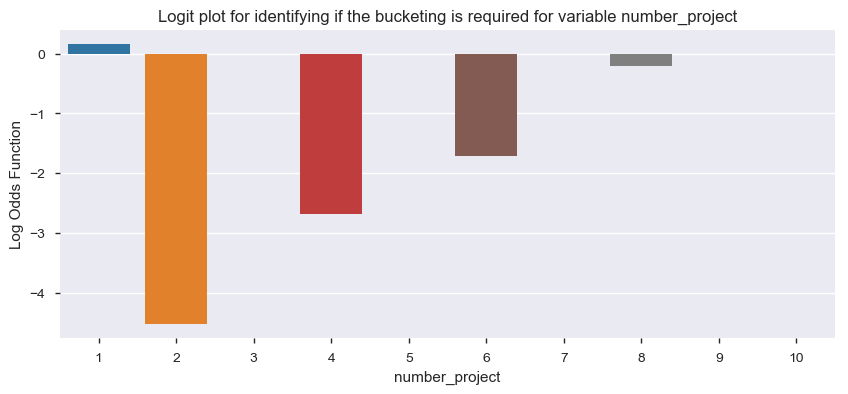

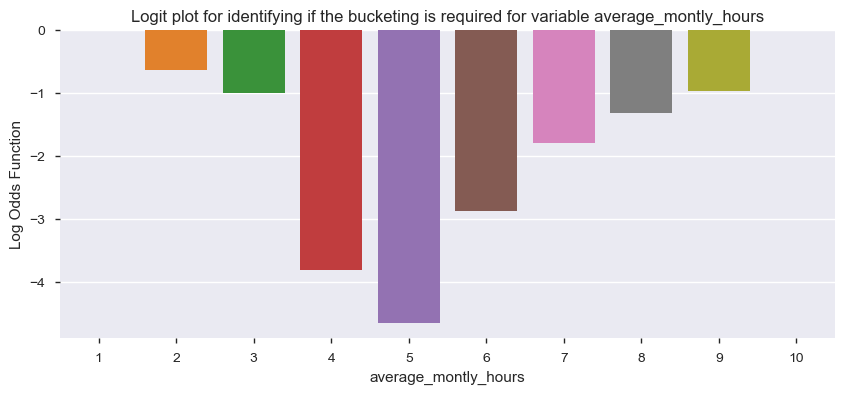

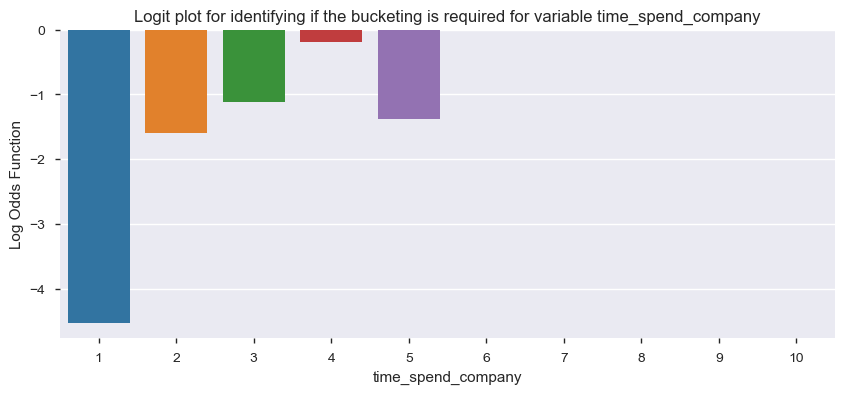

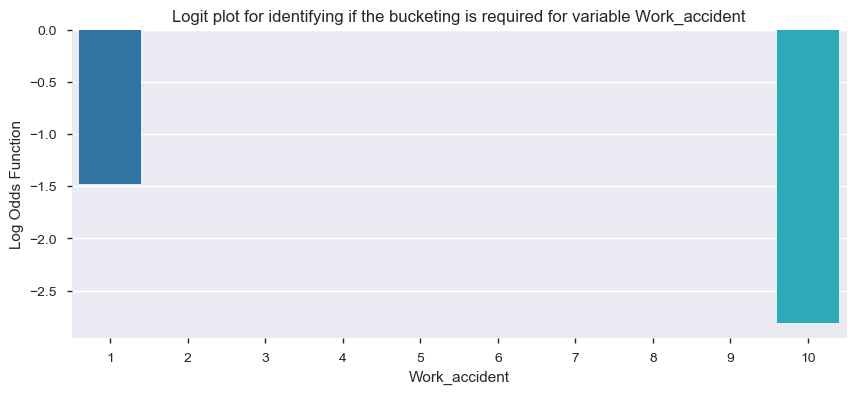

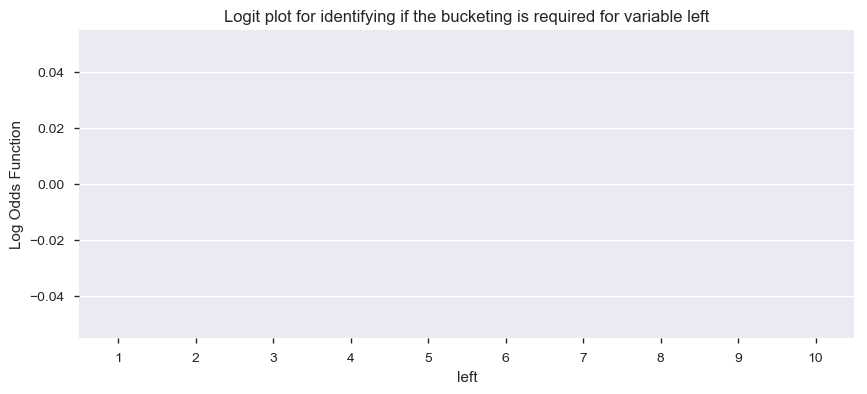

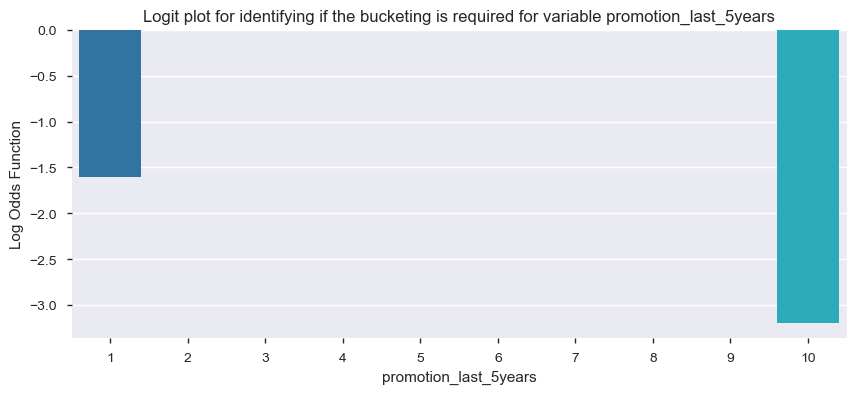

In [24]:
for num_variable in num_var:
    binned = pd.cut(hr_data[num_variable] , bins = 10 , labels = list(range(1,11)))
    binned = binned.dropna()
    logit = hr_data.groupby(binned)['left'].sum() / (hr_data.groupby(binned)['left'].count()- hr_data.groupby(binned)['left'].sum())
    logit = np.log(logit)
    fig , axes = plt.subplots(figsize= (10,4))
    sns.barplot(x = logit.index , y = logit)
    plt.ylabel('Log Odds Function')
    plt.title(str('Logit plot for identifying if the bucketing is required for variable ') + str(num_variable) )
 
    

> These variable needs bucketing : ['satisfaction_level', 'time_spend_company']

In [25]:
#bucketing

hr_num['satisfaction_logit_group'] = pd.cut(hr_num['satisfaction_level'] , bins = 10 , labels = list(range(1,11)))

hr_num['satisfaction_level_extreme'] = np.where(hr_num['satisfaction_logit_group'] == 2 , 'low',
                                               np.where(hr_num['satisfaction_logit_group'] == 7 , 'low',
                                                       np.where(hr_num['satisfaction_logit_group'] == 6 , 'low',
                                                               np.where(hr_num['satisfaction_logit_group'] == 10 , 'low',
                                                                       np.where(hr_num['satisfaction_logit_group'] == 1 , 'high',
                                                                               np.where(hr_num['satisfaction_logit_group'] == 4 , 'high',
                                                                                       np.where(hr_num['satisfaction_logit_group'] == 3 , 'med',
                                                                                               np.where(hr_num['satisfaction_logit_group'] == 8 , 'med',
                                                                                                       np.where(hr_num['satisfaction_logit_group'] == 9 , 'med','other')))))))))
                                               


In [26]:
hr_num['time_spend_company_logit_group'] = pd.cut(hr_num['time_spend_company'] , bins = 10 , labels = list(range(1,11)))
hr_num['time_spend_company_extreme'] = np.where(hr_num['time_spend_company_logit_group'] == 1 , 'low',
                                               np.where(hr_num['time_spend_company_logit_group'] == 2 , 'med' ,
                                                       np.where(hr_num['time_spend_company_logit_group'] == 3 , 'med',
                                                               np.where(hr_num['time_spend_company_logit_group'] == 5 ,'med','other'))))

In [27]:
hr_num.head()

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,left,promotion_last_5years,satisfaction_logit_group,satisfaction_level_extreme,time_spend_company_logit_group,time_spend_company_extreme
0,0.38,0.53,2.0,157.0,3.0,0.0,1.0,0.0,4,high,2,med
1,0.80,0.86,5.0,262.0,6.0,0.0,1.0,0.0,8,med,7,other
2,0.11,0.88,7.0,272.0,4.0,0.0,1.0,0.0,1,high,4,other
3,0.72,0.87,5.0,223.0,5.0,0.0,1.0,0.0,7,low,5,med
4,0.37,0.52,2.0,159.0,3.0,0.0,1.0,0.0,4,high,2,med


In [28]:
hr_num = hr_num.drop(['satisfaction_logit_group' , 'time_spend_company_logit_group'] , axis =1)

In [29]:
hr_num.head()

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,left,promotion_last_5years,satisfaction_level_extreme,time_spend_company_extreme
0,0.38,0.53,2.0,157.0,3.0,0.0,1.0,0.0,high,med
1,0.80,0.86,5.0,262.0,6.0,0.0,1.0,0.0,med,other
2,0.11,0.88,7.0,272.0,4.0,0.0,1.0,0.0,high,other
3,0.72,0.87,5.0,223.0,5.0,0.0,1.0,0.0,low,med
4,0.37,0.52,2.0,159.0,3.0,0.0,1.0,0.0,high,med


- #### Calculating Somer's D : 

In [30]:
somersd_df = pd.DataFrame()

for num_variable in hr_num.columns.difference(['left' , 'satisfaction_level_extreme' , 'time_spend_company_extreme']):
    
    logreg = smf.logit(formula = str('left ~ ')+str(num_variable), data=hr_num)
    result = logreg.fit()
    summ = result.summary2()
    y_score = pd.DataFrame(result.predict())
    y_score.columns = ['Score']
    somers_d = 2*metrics.roc_auc_score(hr_num['left'],y_score) - 1
    temp = pd.DataFrame([num_variable,somers_d]).T
    temp.columns = ['Variable Name', 'SomersD']
    somersd_df = pd.concat([somersd_df, temp], axis=0)

somersd_df

Optimization terminated successfully.
         Current function value: 0.439856
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.447319
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.449467
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.449078
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.448197
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.390184
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.433269
         Iterations 6


,Variable Name,SomersD
0,Work_accident,0.121763
0,average_montly_hours,0.0738999
0,last_evaluation,0.00894385
0,number_project,-0.0120126
0,promotion_last_5years,0.0154819
0,satisfaction_level,0.494017
0,time_spend_company,0.381564


> ####  As variables ['last evaluation' , ' number_project' , 'promotion_last_5years' ]  has very less Somer's D value indicates that these variables are not so effective in predicting variable [ 'left' ]. 

In [31]:
hr_num = hr_num.drop(['last_evaluation' , 'number_project' , 'promotion_last_5years'] , axis = 1)

In [32]:
hr_num.head()

,satisfaction_level,average_montly_hours,time_spend_company,Work_accident,left,satisfaction_level_extreme,time_spend_company_extreme
0,0.38,157.0,3.0,0.0,1.0,high,med
1,0.80,262.0,6.0,0.0,1.0,med,other
2,0.11,272.0,4.0,0.0,1.0,high,other
3,0.72,223.0,5.0,0.0,1.0,low,med
4,0.37,159.0,3.0,0.0,1.0,high,med


In [33]:
fine_classed = pd.DataFrame(hr_num[['satisfaction_level_extreme' , 'time_spend_company_extreme']])

In [34]:
hr_cat = pd.concat([fine_classed , hr_cat] , axis =1)

In [35]:
hr_cat.head()

,satisfaction_level_extreme,time_spend_company_extreme,department,salary
0,high,med,sales,low
1,med,other,sales,medium
2,high,other,sales,medium
3,low,med,sales,low
4,high,med,sales,low


- #### Now we'll create dummy variables for categorical data and then concatenate it with the numerical data : 

In [36]:
def dummy_variables(df , colname):
    col_dummies = pd.get_dummies(df[colname] , prefix = colname)
    col_dummies.drop(col_dummies.columns[0] , axis = 1 , inplace = True)
    df = pd.concat([df , col_dummies] , axis =1)
    df.drop(colname, axis=1 ,inplace =True)
    return (df)
for c_feature in ['satisfaction_level_extreme' , 'time_spend_company_extreme' , 'department' , 'salary']:
    hr_cat[c_feature] = hr_cat[c_feature].astype('category')
    hr_cat = dummy_variables(hr_cat , c_feature)
    

In [37]:
hr_cat.head(10)

,satisfaction_level_extreme_low,satisfaction_level_extreme_med,satisfaction_level_extreme_other,time_spend_company_extreme_med,time_spend_company_extreme_other,department_RandD,department_accounting,department_hr,department_management,department_marketing,department_product_mng,department_sales,department_support,department_technical,salary_low,salary_medium
0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0
1,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,1
2,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1
3,1,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0
4,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0
5,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0
6,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0
7,1,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0
8,0,1,0,1,0,0,0,0,0,0,0,1,0,0,1,0
9,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0


In [38]:
hr_num = hr_num.drop(['satisfaction_level' , 'time_spend_company', 'satisfaction_level_extreme' , 'time_spend_company_extreme'] , axis=1)

In [39]:
hr_num.head(10)

,average_montly_hours,Work_accident,left
0,157.0,0.0,1.0
1,262.0,0.0,1.0
2,272.0,0.0,1.0
3,223.0,0.0,1.0
4,159.0,0.0,1.0
5,153.0,0.0,1.0
6,247.0,0.0,1.0
7,259.0,0.0,1.0
8,224.0,0.0,1.0
9,142.0,0.0,1.0


In [40]:
hr_final = pd.concat([hr_num, hr_cat],axis=1)

In [41]:
hr_final.head()

,average_montly_hours,Work_accident,left,satisfaction_level_extreme_low,satisfaction_level_extreme_med,satisfaction_level_extreme_other,time_spend_company_extreme_med,time_spend_company_extreme_other,department_RandD,department_accounting,department_hr,department_management,department_marketing,department_product_mng,department_sales,department_support,department_technical,salary_low,salary_medium
0,157.0,0.0,1.0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0
1,262.0,0.0,1.0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,1
2,272.0,0.0,1.0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1
3,223.0,0.0,1.0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0
4,159.0,0.0,1.0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0


> Now our data is ready for modeling.

- #### Building model : 

In [42]:
train_features = hr_final.columns.difference(['left'])

In [43]:
train , test = train_test_split(hr_final , test_size = 0.3 , random_state=123 ) 

In [44]:
train.columns

Index(['average_montly_hours', 'Work_accident', 'left',
       'satisfaction_level_extreme_low', 'satisfaction_level_extreme_med',
       'satisfaction_level_extreme_other', 'time_spend_company_extreme_med',
       'time_spend_company_extreme_other', 'department_RandD',
       'department_accounting', 'department_hr', 'department_management',
       'department_marketing', 'department_product_mng', 'department_sales',
       'department_support', 'department_technical', 'salary_low',
       'salary_medium'],
      dtype='object')

In [45]:
logreg = smf.logit(formula = 'left ~ ' + '+'.join(train_features) , data = train)

In [46]:
result = logreg.fit()

Optimization terminated successfully.
         Current function value: 0.262786
         Iterations 8


In [47]:
result.summary2()

<class 'statsmodels.iolib.summary2.Summary'>
"""
                                 Results: Logit
=================================================================================
Model:                     Logit                 Pseudo R-squared:      0.417    
Dependent Variable:        left                  AIC:                   4449.1182
Date:                      2018-09-10 01:07      BIC:                   4582.7861
No. Observations:          8393                  Log-Likelihood:        -2205.6  
Df Model:                  18                    LL-Null:               -3785.0  
Df Residuals:              8374                  LLR p-value:           0.0000   
Converged:                 1.0000                Scale:                 1.0000   
No. Iterations:            8.0000                                                
---------------------------------------------------------------------------------
                                  Coef.  Std.Err.    z     P>|z|   [0.025  0.975]
---------------------------------------------------------------------------------
Intercept                        -5.0119   0.3555 -14.0972 0.0000 -5.7088 -4.3151
Work_accident                    -1.3049   0.1431  -9.1194 0.0000 -1.5853 -1.0244
average_montly_hours              0.0085   0.0008  10.2629 0.0000  0.0069  0.0101
department_RandD                 -0.1411   0.2278  -0.6195 0.5356 -0.5877  0.3054
department_accounting             0.2978   0.2181   1.3653 0.1722 -0.1297  0.7253
department_hr                     0.4105   0.2200   1.8656 0.0621 -0.0208  0.8417
department_management             0.1919   0.2668   0.7190 0.4721 -0.3311  0.7149
department_marketing              0.1270   0.2185   0.5814 0.5610 -0.3012  0.5552
department_product_mng            0.0667   0.2139   0.3120 0.7550 -0.3526  0.4860
department_sales                  0.2702   0.1600   1.6887 0.0913 -0.0434  0.5837
department_support                0.3754   0.1733   2.1663 0.0303  0.0358  0.7150
department_technical              0.3357   0.1684   1.9939 0.0462  0.0057  0.6657
salary_low                        1.7891   0.2133   8.3887 0.0000  1.3711  2.2071
salary_medium                     1.3899   0.2149   6.4688 0.0000  0.9688  1.8111
satisfaction_level_extreme_low   -4.3987   0.1333 -33.0085 0.0000 -4.6599 -4.1376
satisfaction_level_extreme_med   -2.4836   0.0914 -27.1711 0.0000 -2.6627 -2.3044
satisfaction_level_extreme_other -3.6780   0.1812 -20.2948 0.0000 -4.0332 -3.3228
time_spend_company_extreme_med    2.7513   0.1981  13.8877 0.0000  2.3630  3.1396
time_spend_company_extreme_other  2.0894   0.2096   9.9682 0.0000  1.6785  2.5002
=================================================================================

"""

In [48]:
train_features = train_features.difference(['department_accounting' ])
                                           

In [49]:
logreg = smf.logit(formula = 'left ~ '+'+'.join(train_features) , data = train)
result = logreg.fit()

Optimization terminated successfully.
         Current function value: 0.262896
         Iterations 8


In [50]:
result.summary2()

<class 'statsmodels.iolib.summary2.Summary'>
"""
                                 Results: Logit
=================================================================================
Model:                     Logit                 Pseudo R-squared:      0.417    
Dependent Variable:        left                  AIC:                   4448.9755
Date:                      2018-09-10 01:07      BIC:                   4575.6083
No. Observations:          8393                  Log-Likelihood:        -2206.5  
Df Model:                  17                    LL-Null:               -3785.0  
Df Residuals:              8375                  LLR p-value:           0.0000   
Converged:                 1.0000                Scale:                 1.0000   
No. Iterations:            8.0000                                                
---------------------------------------------------------------------------------
                                  Coef.  Std.Err.    z     P>|z|   [0.025  0.975]
---------------------------------------------------------------------------------
Intercept                        -4.8879   0.3428 -14.2569 0.0000 -5.5599 -4.2159
Work_accident                    -1.3042   0.1430  -9.1182 0.0000 -1.5846 -1.0239
average_montly_hours              0.0085   0.0008  10.2726 0.0000  0.0069  0.0101
department_RandD                 -0.2651   0.2078  -1.2756 0.2021 -0.6724  0.1422
department_hr                     0.2866   0.1992   1.4385 0.1503 -0.1039  0.6771
department_management             0.0680   0.2500   0.2721 0.7855 -0.4219  0.5580
department_marketing              0.0031   0.1975   0.0156 0.9876 -0.3841  0.3902
department_product_mng           -0.0572   0.1925  -0.2971 0.7664 -0.4345  0.3201
department_sales                  0.1462   0.1299   1.1256 0.2603 -0.1084  0.4008
department_support                0.2514   0.1459   1.7229 0.0849 -0.0346  0.5375
department_technical              0.2118   0.1401   1.5118 0.1306 -0.0628  0.4865
salary_low                        1.7894   0.2134   8.3849 0.0000  1.3711  2.2076
salary_medium                     1.3902   0.2150   6.4664 0.0000  0.9688  1.8116
satisfaction_level_extreme_low   -4.3991   0.1332 -33.0145 0.0000 -4.6603 -4.1379
satisfaction_level_extreme_med   -2.4837   0.0914 -27.1738 0.0000 -2.6629 -2.3046
satisfaction_level_extreme_other -3.6760   0.1811 -20.2930 0.0000 -4.0310 -3.3210
time_spend_company_extreme_med    2.7497   0.1980  13.8848 0.0000  2.3615  3.1378
time_spend_company_extreme_other  2.0873   0.2095   9.9616 0.0000  1.6766  2.4980
=================================================================================

"""

> #### Now all the p-values are significant, now our model is good to predict the test data.

- #### Now we'll check how good our model is :

In [51]:
# gini values

train_gini = 2*metrics.roc_auc_score(train['left'], result.predict()) - 1
print("The Gini Index for the model built on the Train Data is : ", train_gini)

test_gini = 2*metrics.roc_auc_score(test['left'], result.predict(test)) - 1
print("The Gini Index for the model built on the Test Data is : ", test_gini)

The Gini Index for the model built on the Train Data is :  0.819734739161
The Gini Index for the model built on the Test Data is :  0.843170190227


In [52]:
## Intuition behind ROC curve - for train data

train_predicted_prob = pd.DataFrame(result.predict(train))
train_predicted_prob.columns = ['prob']
train_actual = train['left']
# making a DataFrame with actual and prob columns

train_predict = pd.concat([train_actual, train_predicted_prob], axis=1)
train_predict.columns = ['actual','prob']
train_predict.head()

,actual,prob
8791,0.0,0.065299
3210,0.0,0.042156
3637,0.0,0.006203
2866,0.0,0.029419
1991,1.0,0.725796


In [53]:
# Now we want to set a cutoff value to separate 1's and 0's : for test data
## Intuition behind ROC curve 

test_predicted_prob = pd.DataFrame(result.predict(test))
test_predicted_prob.columns = ['prob']
test_actual = test['left']

# making a DataFrame with actual and prob columns

test_predict = pd.concat([test_actual, test_predicted_prob], axis=1)
test_predict.columns = ['actual','prob']
test_predict.head()

,actual,prob
6816,0.0,0.015768
4649,0.0,0.035064
3169,0.0,0.076376
6485,0.0,0.017577
9388,0.0,0.028077


In [54]:
## Intuition behind ROC curve - confusion matrix for each different cut-off shows trade off in sensitivity and specificity

roc_like_df = pd.DataFrame()
train_temp = train_predict.copy()

for cut_off in np.linspace(0,1,50):
    train_temp['cut_off'] = cut_off
    train_temp['predicted'] = train_temp['prob'].apply(lambda x: 0.0 if x < cut_off else 1.0)
    train_temp['tp'] = train_temp.apply(lambda x: 1.0
                                        if x['actual']==1.0 and x['predicted']==1 else 0.0, axis=1)
    train_temp['fp'] = train_temp.apply(lambda x: 1.0 if x['actual']==0.0 and x['predicted']==1 else 0.0, axis=1)
    train_temp['tn'] = train_temp.apply(lambda x: 1.0 if x['actual']==0.0 and x['predicted']==0 else 0.0, axis=1)
    train_temp['fn'] = train_temp.apply(lambda x: 1.0 if x['actual']==1.0 and x['predicted']==0 else 0.0, axis=1)
    sensitivity = train_temp['tp'].sum() / (train_temp['tp'].sum() + train_temp['fn'].sum())
    specificity = train_temp['tn'].sum() / (train_temp['tn'].sum() + train_temp['fp'].sum())
    roc_like_table = pd.DataFrame([cut_off, sensitivity, specificity]).T
    roc_like_table.columns = ['cutoff', 'sensitivity', 'specificity']
    roc_like_df = pd.concat([roc_like_df, roc_like_table], axis=0)


In [55]:
roc_like_df

,cutoff,sensitivity,specificity
0,0.000000,1.000000,0.000000
0,0.020408,0.979300,0.388015
0,0.040816,0.955746,0.567363
0,0.061224,0.934333,0.665618
0,0.081633,0.909350,0.718822
0,0.102041,0.892220,0.755864
0,0.122449,0.881513,0.779891
0,0.142857,0.868665,0.801201
0,0.163265,0.853676,0.821653
0,0.183673,0.837973,0.843249


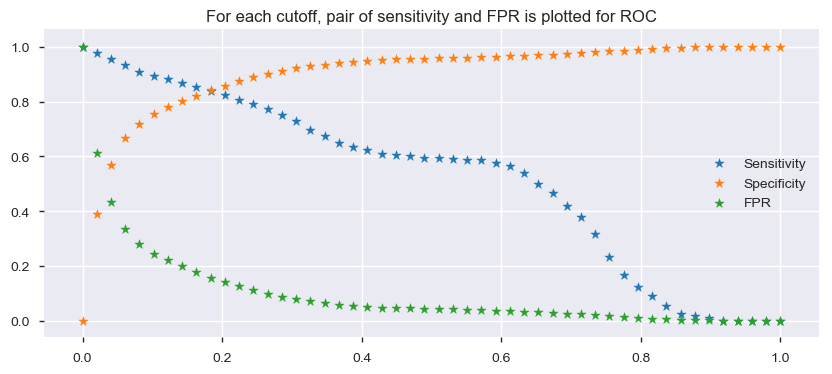

In [58]:
plt.subplots(figsize=(10,4))
plt.scatter(roc_like_df['cutoff'], roc_like_df['sensitivity'], marker='*', label='Sensitivity')
plt.scatter(roc_like_df['cutoff'], roc_like_df['specificity'], marker='*', label='Specificity')
plt.scatter(roc_like_df['cutoff'], 1-roc_like_df['specificity'], marker='*', label='FPR')
plt.title('For each cutoff, pair of sensitivity and FPR is plotted for ROC')
plt.legend()

In [59]:
## Finding ideal cut-off for checking if this remains same in OOS validation
roc_like_df['total'] = roc_like_df['sensitivity'] + roc_like_df['specificity']
roc_like_df[roc_like_df['total']==roc_like_df['total'].max()]

,cutoff,sensitivity,specificity,total
0,0.204082,0.823697,0.858267,1.681964


> So we set our cutoff to be 0.20

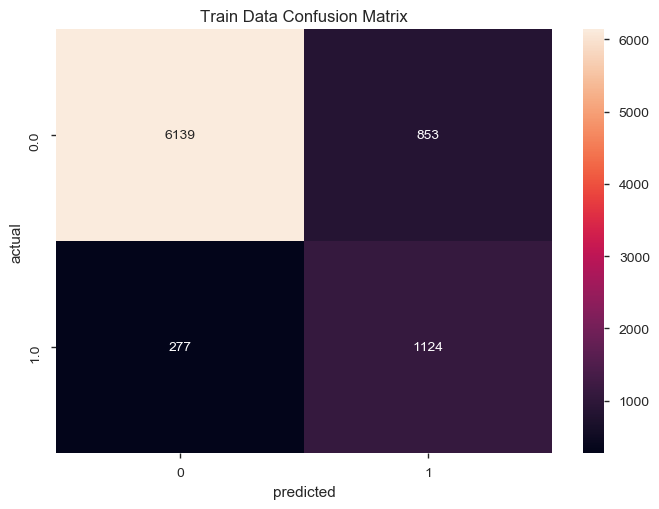

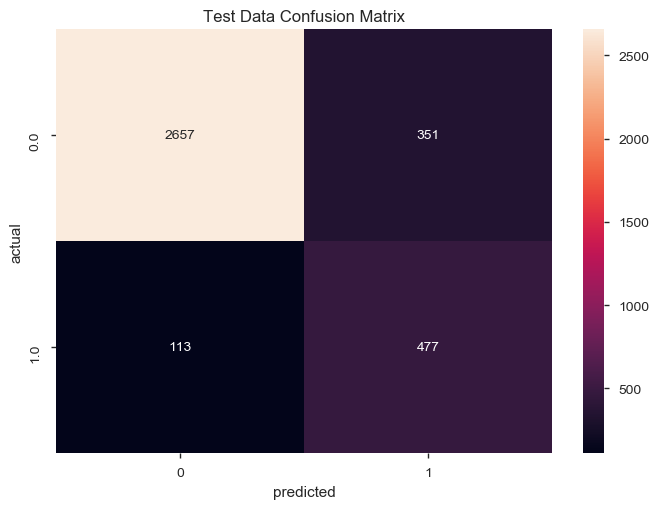

In [60]:
test_predict['predicted'] = test_predict['prob'].apply(lambda x: 1 if x > 0.23 else 0)
train_predict['predicted'] = train_predict['prob'].apply(lambda x: 1 if x > 0.23 else 0)
sns.heatmap(pd.crosstab(train_predict['actual'], train_predict['predicted']), annot=True, fmt='.0f')
plt.title('Train Data Confusion Matrix')
plt.show()
sns.heatmap(pd.crosstab(test_predict['actual'], test_predict['predicted']), annot=True, fmt='.0f')
plt.title('Test Data Confusion Matrix')
plt.show()

In [61]:
print("The overall accuracy score for the Train Data is : ", metrics.accuracy_score(train_predict.actual, train_predict.predicted))
print("The overall accuracy score for the Test Data  is : ", metrics.accuracy_score(test_predict.actual, test_predict.predicted))

The overall accuracy score for the Train Data is :  0.865363993804
The overall accuracy score for the Test Data  is :  0.87103946637


> The accuracy of our model is 87%

### Building Decision Tree Classifier : 

In [62]:
import sklearn.tree as dt

In [63]:
from sklearn import metrics
from sklearn.tree import DecisionTreeClassifier,  export_graphviz , export
from sklearn.grid_search import GridSearchCV

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\grid_search.py:42: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. This module will be removed in 0.20.
  DeprecationWarning)


#### Fine Tuning the parameters : 

In [64]:
# Now we'll prepare the data for decision trees

hr_num = hr_data[num_var]
hr_cat = hr_data[cat_var]

In [65]:
hr_num=hr_num.apply(outlier_capping)

In [66]:
def dummy_variables(df , colname):
    col_dummies = pd.get_dummies(df[colname] , prefix = colname)
    col_dummies.drop(col_dummies.columns[0] , axis = 1 , inplace = True)
    df = pd.concat([df , col_dummies] , axis =1)
    df.drop(colname, axis=1 ,inplace =True)
    return (df)
for c_feature in [ 'department' , 'salary']:
    hr_cat[c_feature] = hr_cat[c_feature].astype('category')
    hr_cat = dummy_variables(hr_cat , c_feature)

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


In [67]:
hr_final  = pd.concat([hr_num , hr_cat] , axis = 1)

In [68]:
features = hr_final.columns.difference(['left'])


In [69]:
train_x , test_x , train_y , test_y = train_test_split(hr_final[features],hr_final['left'],
                                                                           test_size = 0.2,
                                                                          random_state = 123 )

In [70]:
param_grid = {'max_depth': np.arange(3, 12),
             'min_samples_split': np.arange(5,15)}

In [71]:
tree = GridSearchCV(DecisionTreeClassifier(), param_grid, cv = 8)
tree.fit( train_x, train_y )

GridSearchCV(cv=8, error_score='raise',
       estimator=DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best'),
       fit_params={}, iid=True, n_jobs=1,
       param_grid={'max_depth': array([ 3,  4,  5,  6,  7,  8,  9, 10, 11]), 'min_samples_split': array([ 5,  6,  7,  8,  9, 10, 11, 12, 13, 14])},
       pre_dispatch='2*n_jobs', refit=True, scoring=None, verbose=0)

In [72]:
tree.best_params_

{'max_depth': 7, 'min_samples_split': 14}

In [73]:
tree.best_score_

0.9840492076730609

### Building Final Decision Tree Model

In [74]:
clf_tree = DecisionTreeClassifier( max_depth = 8, min_samples_split=6 )
clf_tree.fit( train_x, train_y )

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=8,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=6,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

In [75]:
tree_test_pred = pd.DataFrame( { 'actual':  test_y,
                            'predicted': clf_tree.predict( test_x ) } )

In [76]:
tree_test_pred.sample( n = 50 )

,actual,predicted
5738,0.0,0.0
257,1.0,1.0
1383,1.0,1.0
1968,1.0,1.0
8490,0.0,0.0
5693,0.0,0.0
8202,0.0,0.0
1338,1.0,0.0
7633,0.0,0.0
178,1.0,1.0


In [77]:
metrics.accuracy_score( tree_test_pred.actual, tree_test_pred.predicted )

0.98040850354314302

Text(0.5,28.3611,'Predicted label')

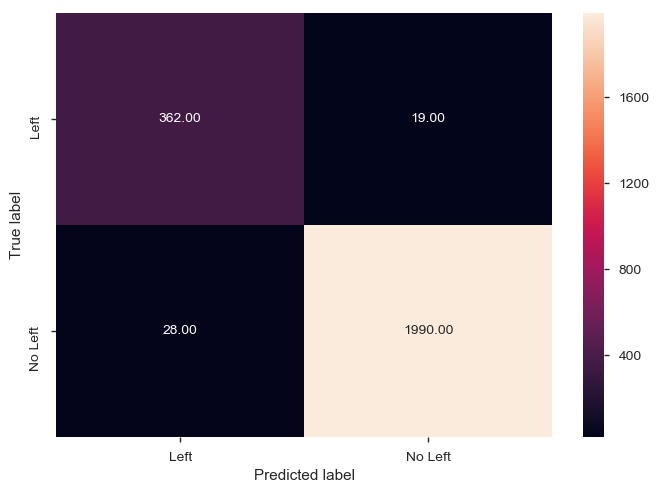

In [78]:
tree_cm = metrics.confusion_matrix( tree_test_pred.predicted,
                                 tree_test_pred.actual,
                                 [1,0] )
sns.heatmap(tree_cm, annot=True,
         fmt='.2f',
         xticklabels = ["Left", "No Left"] , yticklabels = ["Left", "No Left"] )

plt.ylabel('True label')
plt.xlabel('Predicted label')

In [83]:
import os     
os.environ["PATH"] += os.pathsep + r'C:\Users\SHIVAM-PC\Downloads\GraphViz\release\bin'

In [84]:
# Visualizing Decision Tree via Graphviz

export_graphviz( clf_tree,
              out_file = "hr_tree.odt",
              feature_names = train_x.columns )

In [85]:
import pydotplus as pdot

chd_tree_graph = pdot.graphviz.graph_from_dot_file( 'hr_tree.odt' )

In [86]:
chd_tree_graph.write_jpg( 'hr_tree.jpg' )

True

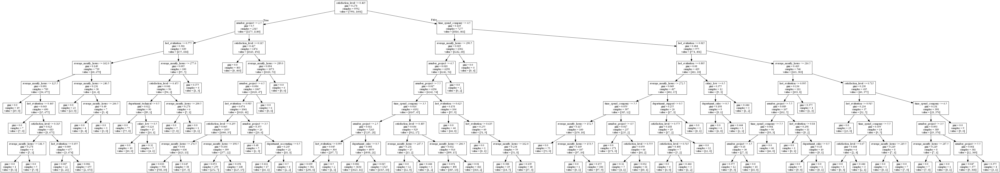

In [87]:
from IPython.display import Image
Image(filename='hr_tree.jpg')

In [89]:
list( zip( train_x.columns, clf_tree.feature_importances_ ) )

[('Work_accident', 0.0),
 ('average_montly_hours', 0.09371323128626223),
 ('department_RandD', 0.0),
 ('department_accounting', 0.00051699512013457863),
 ('department_hr', 0.0),
 ('department_management', 0.0),
 ('department_marketing', 0.0),
 ('department_product_mng', 0.0),
 ('department_sales', 0.00093683169119753568),
 ('department_support', 0.00062385891847537825),
 ('department_technical', 4.5572162441491109e-05),
 ('last_evaluation', 0.15160757954603796),
 ('number_project', 0.12679972161947403),
 ('promotion_last_5years', 0.0),
 ('salary_low', 0.000679025220378238),
 ('salary_medium', 0.0),
 ('satisfaction_level', 0.50541737692187205),
 ('time_spend_company', 0.1196598075137264)]

### Ensemble Modeling  :

####  Bagging  : (Bootstrap Aggregating)

In [90]:
from sklearn.ensemble import BaggingClassifier

In [91]:
help(BaggingClassifier)

Help on class BaggingClassifier in module sklearn.ensemble.bagging:

class BaggingClassifier(BaseBagging, sklearn.base.ClassifierMixin)
 |  A Bagging classifier.
 |  
 |  A Bagging classifier is an ensemble meta-estimator that fits base
 |  classifiers each on random subsets of the original dataset and then
 |  aggregate their individual predictions (either by voting or by averaging)
 |  to form a final prediction. Such a meta-estimator can typically be used as
 |  a way to reduce the variance of a black-box estimator (e.g., a decision
 |  tree), by introducing randomization into its construction procedure and
 |  then making an ensemble out of it.
 |  
 |  This algorithm encompasses several works from the literature. When random
 |  subsets of the dataset are drawn as random subsets of the samples, then
 |  this algorithm is known as Pasting [1]_. If samples are drawn with
 |  replacement, then the method is known as Bagging [2]_. When random subsets
 |  of the dataset are drawn as ra

In [100]:
bagclf = BaggingClassifier(oob_score=True, n_estimators=100)
bagclf.fit(train_x, train_y)

BaggingClassifier(base_estimator=None, bootstrap=True,
         bootstrap_features=False, max_features=1.0, max_samples=1.0,
         n_estimators=100, n_jobs=1, oob_score=True, random_state=None,
         verbose=0, warm_start=False)

In [101]:
y_pred = pd.DataFrame( { 'actual':  test_y,
                            'predicted': bagclf.predict( test_x) } )

In [102]:
metrics.accuracy_score(y_pred.actual , y_pred.predicted)

0.98457690704460188

Text(0.5,28.3611,'Predicted label')

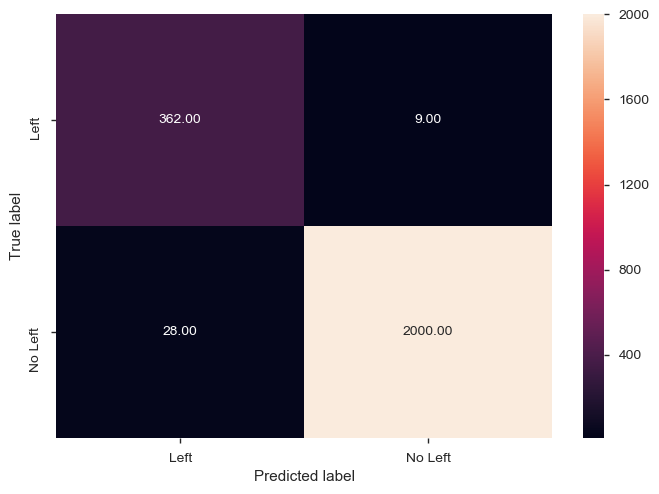

In [104]:
tree_bg = metrics.confusion_matrix( y_pred.predicted,
                                 y_pred.actual,
                                 [1,0] )
sns.heatmap(tree_bg, annot=True,
         fmt='.2f',
         xticklabels = ["Left", "No Left"] , yticklabels = ["Left", "No Left"] )

plt.ylabel('True label')
plt.xlabel('Predicted label')

In [107]:
# Estimating Errors : 
bagclf.oob_score_

0.98394495412844041

#### Random Forest : 


In [108]:
from sklearn.ensemble import RandomForestClassifier

In [109]:
rf_clf = RandomForestClassifier(oob_score=True,n_estimators=100 )
rf_clf.fit( train_x, train_y )

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=1,
            oob_score=True, random_state=None, verbose=0, warm_start=False)

In [110]:
random_test_pred = pd.DataFrame( { 'actual':  test_y,
                            'predicted': rf_clf.predict( test_x ) } )

In [111]:
metrics.accuracy_score(random_test_pred.actual , random_test_pred.predicted)

0.98499374739474777

Text(0.5,28.3611,'Predicted label')

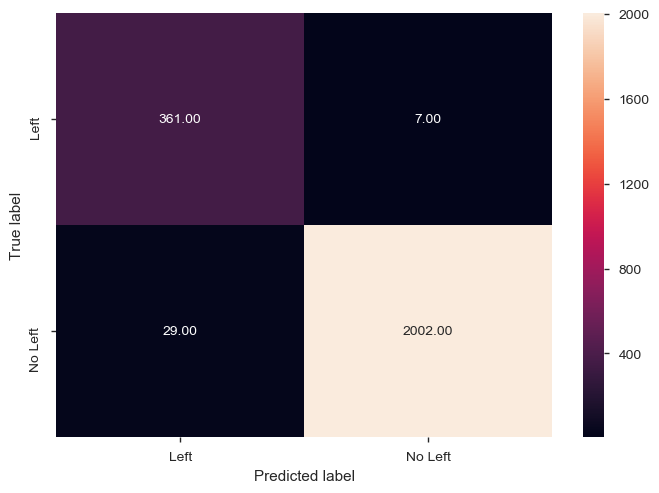

In [114]:
tree_cm = metrics.confusion_matrix( random_test_pred.predicted,
                                 random_test_pred.actual,
                                 [1,0] )
sns.heatmap(tree_cm, annot=True,
         fmt='.2f',
         xticklabels = ["Left", "No Left"] , yticklabels = ["Left", "No Left"] )

plt.ylabel('True label')
plt.xlabel('Predicted label')

In [115]:
rf_clf.feature_importances_

array([ 0.00820944,  0.15209502,  0.00188316,  0.00183468,  0.00174198,
        0.00150678,  0.00170933,  0.00126747,  0.00350003,  0.00269622,
        0.00327992,  0.12331466,  0.18486318,  0.00151401,  0.00598842,
        0.00343746,  0.32496303,  0.17619523])

In [117]:
indices = np.argsort(rf_clf.feature_importances_)[::-1]

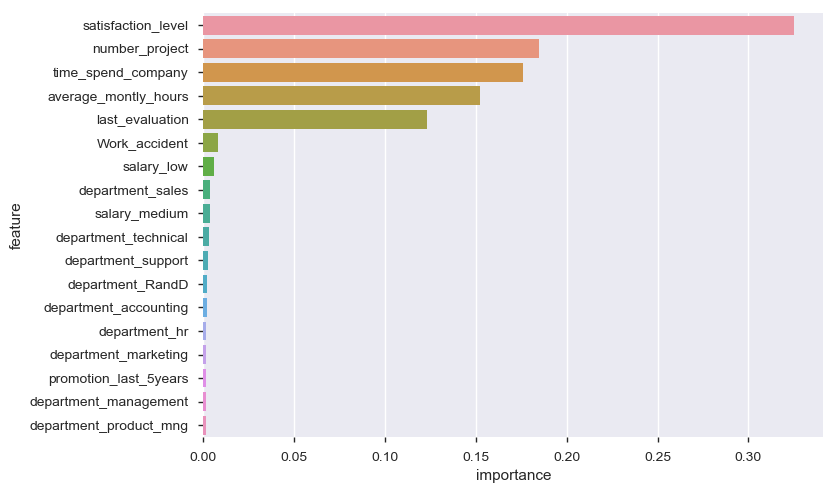

In [123]:
indices = np.argsort(rf_clf.feature_importances_)[::-1]
feature_rank = pd.DataFrame( columns = ['rank', 'feature', 'importance'] )
for f in range(train_x.shape[1]):
  feature_rank.loc[f] = [f+1,
                         train_x.columns[indices[f]],
                         rf_clf.feature_importances_[indices[f]]]
sns.barplot( y = 'feature', x = 'importance', data = feature_rank )

#### Boosting : 

In [124]:
from sklearn.ensemble import AdaBoostClassifier , GradientBoostingClassifier

In [125]:
pargrid_ada = {'n_estimators': [100, 200, 400, 600, 800],
               'learning_rate': [10 ** x for x in range(-3, 3)]}

In [127]:
ada = GridSearchCV(estimator=AdaBoostClassifier(),
                  param_grid = pargrid_ada,
                  cv = 6, verbose = True , n_jobs = 1)

In [128]:
ada.fit(train_x , train_y)

Fitting 6 folds for each of 30 candidates, totalling 180 fits


C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: overflow encountered in exp
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:166: RuntimeWarning: invalid value encountered in true_divide
  sample_weight /= sample_weight_sum
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value e

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:290: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-pack

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:605: RuntimeWarning: invalid value encountered in greater
  return self.classes_.take(pred > 0, axis=0)
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: overflow encountered in exp
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:166: RuntimeWarning: invalid value encountered in true_divide
  sample_weight /= sample_weight_sum
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWa

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:605: RuntimeWarning: invalid value encountered in greater
  return self.classes_.take(pred > 0, axis=0)
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: overflow encountered in exp
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:166: RuntimeWarning: invalid value encountered in true_divide
  sample_weight /= sample_weight_sum
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWa

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:605: RuntimeWarning: invalid value encountered in greater
  return self.classes_.take(pred > 0, axis=0)
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: overflow encountered in exp
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:166: RuntimeWarning: invalid value encountered in true_divide
  sample_weight /= sample_weight_sum
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWa

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:605: RuntimeWarning: invalid value encountered in greater
  return self.classes_.take(pred > 0, axis=0)
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: overflow encountered in exp
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:166: RuntimeWarning: invalid value encountered in true_divide
  sample_weight /= sample_weight_sum
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWa

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:605: RuntimeWarning: invalid value encountered in greater
  return self.classes_.take(pred > 0, axis=0)
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: overflow encountered in exp
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:166: RuntimeWarning: invalid value encountered in true_divide
  sample_weight /= sample_weight_sum
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWa

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:605: RuntimeWarning: invalid value encountered in greater
  return self.classes_.take(pred > 0, axis=0)
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: overflow encountered in exp
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:166: RuntimeWarning: invalid value encountered in true_divide
  sample_weight /= sample_weight_sum
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWa

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:605: RuntimeWarning: invalid value encountered in greater
  return self.classes_.take(pred > 0, axis=0)
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: overflow encountered in exp
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:166: RuntimeWarning: invalid value encountered in true_divide
  sample_weight /= sample_weight_sum
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWa

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:605: RuntimeWarning: invalid value encountered in greater
  return self.classes_.take(pred > 0, axis=0)
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: overflow encountered in exp
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:166: RuntimeWarning: invalid value encountered in true_divide
  sample_weight /= sample_weight_sum
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWa

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:605: RuntimeWarning: invalid value encountered in greater
  return self.classes_.take(pred > 0, axis=0)
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: overflow encountered in exp
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:166: RuntimeWarning: invalid value encountered in true_divide
  sample_weight /= sample_weight_sum
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWa

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:605: RuntimeWarning: invalid value encountered in greater
  return self.classes_.take(pred > 0, axis=0)
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: overflow encountered in exp
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:166: RuntimeWarning: invalid value encountered in true_divide
  sample_weight /= sample_weight_sum
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWa

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:605: RuntimeWarning: invalid value encountered in greater
  return self.classes_.take(pred > 0, axis=0)
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: overflow encountered in exp
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:166: RuntimeWarning: invalid value encountered in true_divide
  sample_weight /= sample_weight_sum
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWa

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:533: RuntimeWarning: invalid value encountered in less
  (estimator_weight < 0)))
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:521: RuntimeWarning: invalid value encountered in less
  proba[proba < np.finfo(proba.dtype).eps] = np.finfo(proba.dtype).eps
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:532: RuntimeWarning: invalid value encountered in greater
  ((sample_weight > 0) |
C:\Users\SHIVAM-PC\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:53

GridSearchCV(cv=6, error_score='raise',
       estimator=AdaBoostClassifier(algorithm='SAMME.R', base_estimator=None,
          learning_rate=1.0, n_estimators=50, random_state=None),
       fit_params={}, iid=True, n_jobs=1,
       param_grid={'n_estimators': [100, 200, 400, 600, 800], 'learning_rate': [0.001, 0.01, 0.1, 1, 10, 100]},
       pre_dispatch='2*n_jobs', refit=True, scoring=None, verbose=True)

In [129]:
ada.best_params_

{'learning_rate': 0.1, 'n_estimators': 800}

In [130]:
help(AdaBoostClassifier)

Help on class AdaBoostClassifier in module sklearn.ensemble.weight_boosting:

class AdaBoostClassifier(BaseWeightBoosting, sklearn.base.ClassifierMixin)
 |  An AdaBoost classifier.
 |  
 |  An AdaBoost [1] classifier is a meta-estimator that begins by fitting a
 |  classifier on the original dataset and then fits additional copies of the
 |  classifier on the same dataset but where the weights of incorrectly
 |  classified instances are adjusted such that subsequent classifiers focus
 |  more on difficult cases.
 |  
 |  This class implements the algorithm known as AdaBoost-SAMME [2].
 |  
 |  Read more in the :ref:`User Guide <adaboost>`.
 |  
 |  Parameters
 |  ----------
 |  base_estimator : object, optional (default=DecisionTreeClassifier)
 |      The base estimator from which the boosted ensemble is built.
 |      Support for sample weighting is required, as well as proper `classes_`
 |      and `n_classes_` attributes.
 |  
 |  n_estimators : integer, optional (default=50)
 |    